## Configuración inicial

A continuación se importan las librerías necesarias para el funcionamiento del notebook. 

In [1]:
#plots and data
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

#metrics and transformations
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn import metrics

#Model 
import xgboost as xgb

sns.set()

In [4]:
def plot_predict_test(df_test_y,testPredict,lag):
        ### Resultado predicción datos de entrenamiento
    fig, ax = plt.subplots(figsize=[15,8])
    sns.lineplot(df_test_y.flatten(),label="real")
    sns.lineplot(testPredict.flatten(),label="predicción")
    plt.title("Comparación valor real y predicción")
    plt.ylabel("value")

In [5]:
def createLagFeature(name_features,lag,df):
    for name_feature in name_features:
        for i in range(1,lag+1):
            df[name_feature+"lag"+str(i)]=df[name_feature].shift(i)
    return df

In [6]:
#function to measure the performance
def timeseries_evaluation_metrics_func(y_true, y_pred,flag):
    def mean_absolute_percentage_error(y_true, y_pred): 
        epsilon=0.1e-5
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    if flag : print(f'R2 is : {metrics.r2_score(y_true, y_pred)}',end='\n\n')
    else:
        print('Evaluation metric results:')
        print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
        print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
        print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
        print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)}')
        
    return {"MSE":metrics.mean_squared_error(y_true, y_pred),
           "MAE":metrics.mean_absolute_error(y_true, y_pred),
           "RMSE":np.sqrt(metrics.mean_squared_error(y_true, y_pred)),
           "MAPE":mean_absolute_percentage_error(y_true, y_pred)}

---

## Cargar y preparar los datos.

In [2]:
df = pd.read_csv("../../Datasets/Datos_antes_pandemia/data_antes_vol.csv")

df['Fecha'] = pd.to_datetime(df['Fecha'])
df = df.sort_values('Fecha', ascending=True)
df = df.rename(columns = {'Vol. Futuros': 'VolFuturos'})
df

,Fecha,VolFuturos
0,2010-01-01,0.000000
1,2010-01-02,4.256365
2,2010-01-03,0.794545
3,2010-01-04,0.787899
4,2010-01-05,0.601027
...,...,...
3648,2019-12-27,4.003614
3649,2019-12-28,2.090121
3650,2019-12-29,0.539108
3651,2019-12-30,1.815513


---

## Desarrollo delo modelo XGBoost

In [8]:
#objects to scale the data 
sc=StandardScaler()
sc2=StandardScaler()

In [9]:
df_stats=df

In [10]:
#
len_data=df_stats.shape[0]

#get target
df_label=df_stats["VolFuturos"].values.reshape(len_data,1)
#get attributes
df_data=df_stats.drop(columns=["Fecha"])

#apply scale
#df_label=sc.fit_transform(df_label)
#df_data_normalize=sc2.fit_transform(df_data)


In [19]:
def Model(df_data,df_label,lag,estimators):
    delete_columns=list(df_data.columns)
    df_data_lags=createLagFeature(df_data.columns,lag,df_data) if lag>0 else df_data
    df_data_lags.drop(columns=delete_columns,inplace=True)
    df_data_lags=df_data_lags[lag:]
    #transform data
    df_data_lags=sc2.fit_transform(df_data_lags)
    
    #split data
    #last index of the train data
    seventy_percent=int(len_data*0.7)

    #split the data normalize
    df_train=df_data_lags[:seventy_percent]
    df_test=df_data_lags[seventy_percent:]

    #split labels
    df_label=df_label[lag:]
    df_train_y=df_label[:seventy_percent]
    df_test_y=df_label[seventy_percent:]
    #split labels normalize
    df_label_normalize=sc.fit_transform(df_label)
    df_train_y_normalize=df_label_normalize[:seventy_percent]
    df_test_y_normalize=df_label_normalize[seventy_percent:]
    
   
    #make model
    model=xgb.XGBRegressor(n_estimators=estimators
                        ,early_stopping_rounds=80)
    #fit the model with the train data
    
    history=model.fit(df_train,df_train_y_normalize,
          eval_set=[(df_train,df_train_y_normalize),(df_test,df_test_y_normalize)])
   
    # make predictions
    trainPredict = model.predict(df_train)
    trainPredict = np.reshape(trainPredict,(len(trainPredict),1))
    # invert transformation
    trainPredict = sc.inverse_transform(trainPredict)
    trainY = df_train_y
    
    # make predictions
    testPredict = model.predict(df_test)
    # invert transformation
    testPredict = np.reshape(testPredict,(len(testPredict),1))
    testPredict = sc.inverse_transform(testPredict)
    testY = df_test_y
    print("len test: ",testY.shape)
    print("len PREDICT: ",testPredict.shape)
    
    plot_predict_test(df_train_y,trainPredict,lag)
    plot_predict_test(df_test_y,testPredict,lag)
    return [{"Fecha":df_stats.Fecha[lag:][:seventy_percent],"typeXGBoost":["train"]*len(trainPredict.flatten()),"XGBoost" :trainPredict.flatten()}
            ,{"Fecha":df_stats.Fecha[lag:][seventy_percent:],"typeXGBoost":["test"]*len(testPredict.flatten()),"XGBoost":testPredict.flatten()}]
    
    return {"train":timeseries_evaluation_metrics_func(trainY.flatten()+1, trainPredict.flatten()+1,False),
           "test":timeseries_evaluation_metrics_func(testY.flatten()+1, testPredict.flatten()+1,False)}

## Resultados 

[0]	validation_0-rmse:1.04996	validation_1-rmse:0.96968
[1]	validation_0-rmse:0.99734	validation_1-rmse:0.92289
[2]	validation_0-rmse:0.96405	validation_1-rmse:0.89776
[3]	validation_0-rmse:0.93574	validation_1-rmse:0.88484
[4]	validation_0-rmse:0.91694	validation_1-rmse:0.87772
[5]	validation_0-rmse:0.90149	validation_1-rmse:0.87405
[6]	validation_0-rmse:0.89314	validation_1-rmse:0.87289
[7]	validation_0-rmse:0.88322	validation_1-rmse:0.87222
[8]	validation_0-rmse:0.87986	validation_1-rmse:0.87062
[9]	validation_0-rmse:0.87391	validation_1-rmse:0.87046
len test:  (1093, 1)
len PREDICT:  (1093, 1)
Evaluation metric results:
MSE is : 0.9889778262359104
MAE is : 0.7462172471510302
RMSE is : 0.9944736428060376
MAPE is : 37.420247884616614
Evaluation metric results:
MSE is : 0.9811811662639958
MAE is : 0.7546084230823947
RMSE is : 0.9905458930630099
MAPE is : 41.559884010763525
[0]	validation_0-rmse:1.04996	validation_1-rmse:0.96968
[1]	validation_0-rmse:0.99734	validation_1-rmse:0.92289
[

[22]	validation_0-rmse:0.78129	validation_1-rmse:0.88383
[23]	validation_0-rmse:0.77105	validation_1-rmse:0.88391
[24]	validation_0-rmse:0.76759	validation_1-rmse:0.88380
[25]	validation_0-rmse:0.76586	validation_1-rmse:0.88480
[26]	validation_0-rmse:0.75673	validation_1-rmse:0.88506
[27]	validation_0-rmse:0.75270	validation_1-rmse:0.88773
[28]	validation_0-rmse:0.74135	validation_1-rmse:0.88929
[29]	validation_0-rmse:0.73850	validation_1-rmse:0.89054
[30]	validation_0-rmse:0.73048	validation_1-rmse:0.88959
[31]	validation_0-rmse:0.71912	validation_1-rmse:0.88932
[32]	validation_0-rmse:0.71175	validation_1-rmse:0.89102
[33]	validation_0-rmse:0.70272	validation_1-rmse:0.89123
[34]	validation_0-rmse:0.69134	validation_1-rmse:0.89312
[35]	validation_0-rmse:0.68715	validation_1-rmse:0.89299
[36]	validation_0-rmse:0.68454	validation_1-rmse:0.89304
[37]	validation_0-rmse:0.68221	validation_1-rmse:0.89418
[38]	validation_0-rmse:0.67528	validation_1-rmse:0.89453
[39]	validation_0-rmse:0.66661	

[45]	validation_0-rmse:0.63857	validation_1-rmse:0.89977
[46]	validation_0-rmse:0.62738	validation_1-rmse:0.90029
[47]	validation_0-rmse:0.62123	validation_1-rmse:0.90156
[48]	validation_0-rmse:0.61820	validation_1-rmse:0.90172
[49]	validation_0-rmse:0.61541	validation_1-rmse:0.90274
[50]	validation_0-rmse:0.61373	validation_1-rmse:0.90259
[51]	validation_0-rmse:0.61115	validation_1-rmse:0.90324
[52]	validation_0-rmse:0.60639	validation_1-rmse:0.90373
[53]	validation_0-rmse:0.59520	validation_1-rmse:0.90369
[54]	validation_0-rmse:0.58813	validation_1-rmse:0.90528
[55]	validation_0-rmse:0.58068	validation_1-rmse:0.90407
[56]	validation_0-rmse:0.57187	validation_1-rmse:0.90452
[57]	validation_0-rmse:0.56663	validation_1-rmse:0.90508
[58]	validation_0-rmse:0.56246	validation_1-rmse:0.90675
[59]	validation_0-rmse:0.55654	validation_1-rmse:0.90800
[60]	validation_0-rmse:0.55535	validation_1-rmse:0.90817
[61]	validation_0-rmse:0.55210	validation_1-rmse:0.90896
[62]	validation_0-rmse:0.55160	

[28]	validation_0-rmse:0.74135	validation_1-rmse:0.88929
[29]	validation_0-rmse:0.73850	validation_1-rmse:0.89054
[30]	validation_0-rmse:0.73048	validation_1-rmse:0.88959
[31]	validation_0-rmse:0.71912	validation_1-rmse:0.88932
[32]	validation_0-rmse:0.71175	validation_1-rmse:0.89102
[33]	validation_0-rmse:0.70272	validation_1-rmse:0.89123
[34]	validation_0-rmse:0.69134	validation_1-rmse:0.89312
[35]	validation_0-rmse:0.68715	validation_1-rmse:0.89299
[36]	validation_0-rmse:0.68454	validation_1-rmse:0.89304
[37]	validation_0-rmse:0.68221	validation_1-rmse:0.89418
[38]	validation_0-rmse:0.67528	validation_1-rmse:0.89453
[39]	validation_0-rmse:0.66661	validation_1-rmse:0.89381
[40]	validation_0-rmse:0.66194	validation_1-rmse:0.89317
[41]	validation_0-rmse:0.65484	validation_1-rmse:0.89605
[42]	validation_0-rmse:0.64584	validation_1-rmse:0.89832
[43]	validation_0-rmse:0.64449	validation_1-rmse:0.89937
[44]	validation_0-rmse:0.64123	validation_1-rmse:0.89992
[45]	validation_0-rmse:0.63857	

[78]	validation_0-rmse:0.50601	validation_1-rmse:0.91747
[79]	validation_0-rmse:0.50229	validation_1-rmse:0.91818
[80]	validation_0-rmse:0.49798	validation_1-rmse:0.91867
[81]	validation_0-rmse:0.49394	validation_1-rmse:0.92085
[82]	validation_0-rmse:0.49312	validation_1-rmse:0.92157
[83]	validation_0-rmse:0.48837	validation_1-rmse:0.92360
[84]	validation_0-rmse:0.48543	validation_1-rmse:0.92405
[85]	validation_0-rmse:0.48404	validation_1-rmse:0.92430
[86]	validation_0-rmse:0.48052	validation_1-rmse:0.92486
[87]	validation_0-rmse:0.47765	validation_1-rmse:0.92695
[88]	validation_0-rmse:0.47453	validation_1-rmse:0.92769
len test:  (1093, 1)
len PREDICT:  (1093, 1)
Evaluation metric results:
MSE is : 0.9889778262359104
MAE is : 0.7462172471510302
RMSE is : 0.9944736428060376
MAPE is : 37.420247884616614
Evaluation metric results:
MSE is : 0.9811811662639958
MAE is : 0.7546084230823947
RMSE is : 0.9905458930630099
MAPE is : 41.559884010763525
[0]	validation_0-rmse:1.04996	validation_1-rms

<ipython-input-14-33776066f32a>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=[15,8])


Evaluation metric results:
MSE is : 0.9889778262359104
MAE is : 0.7462172471510302
RMSE is : 0.9944736428060376
MAPE is : 37.420247884616614
Evaluation metric results:
MSE is : 0.9811811662639958
MAE is : 0.7546084230823947
RMSE is : 0.9905458930630099
MAPE is : 41.559884010763525
[0]	validation_0-rmse:1.04996	validation_1-rmse:0.96968
[1]	validation_0-rmse:0.99734	validation_1-rmse:0.92289
[2]	validation_0-rmse:0.96405	validation_1-rmse:0.89776
[3]	validation_0-rmse:0.93574	validation_1-rmse:0.88484
[4]	validation_0-rmse:0.91694	validation_1-rmse:0.87772
[5]	validation_0-rmse:0.90149	validation_1-rmse:0.87405
[6]	validation_0-rmse:0.89314	validation_1-rmse:0.87289
[7]	validation_0-rmse:0.88322	validation_1-rmse:0.87222
[8]	validation_0-rmse:0.87986	validation_1-rmse:0.87062
[9]	validation_0-rmse:0.87391	validation_1-rmse:0.87046
[10]	validation_0-rmse:0.86826	validation_1-rmse:0.87488
[11]	validation_0-rmse:0.86436	validation_1-rmse:0.87625
[12]	validation_0-rmse:0.86252	validation_1-

[4]	validation_0-rmse:0.87039	validation_1-rmse:0.87506
[5]	validation_0-rmse:0.85903	validation_1-rmse:0.87421
[6]	validation_0-rmse:0.84818	validation_1-rmse:0.87110
[7]	validation_0-rmse:0.84189	validation_1-rmse:0.86952
[8]	validation_0-rmse:0.83689	validation_1-rmse:0.86952
[9]	validation_0-rmse:0.83018	validation_1-rmse:0.87063
[10]	validation_0-rmse:0.82689	validation_1-rmse:0.87025
[11]	validation_0-rmse:0.80945	validation_1-rmse:0.87381
[12]	validation_0-rmse:0.80495	validation_1-rmse:0.87530
[13]	validation_0-rmse:0.80034	validation_1-rmse:0.87625
[14]	validation_0-rmse:0.78334	validation_1-rmse:0.87810
[15]	validation_0-rmse:0.77949	validation_1-rmse:0.88046
[16]	validation_0-rmse:0.77413	validation_1-rmse:0.87996
[17]	validation_0-rmse:0.76991	validation_1-rmse:0.88094
[18]	validation_0-rmse:0.76064	validation_1-rmse:0.88421
[19]	validation_0-rmse:0.75562	validation_1-rmse:0.88535
[20]	validation_0-rmse:0.75037	validation_1-rmse:0.88781
[21]	validation_0-rmse:0.74757	valida

[12]	validation_0-rmse:0.80495	validation_1-rmse:0.87530
[13]	validation_0-rmse:0.80034	validation_1-rmse:0.87625
[14]	validation_0-rmse:0.78334	validation_1-rmse:0.87810
[15]	validation_0-rmse:0.77949	validation_1-rmse:0.88046
[16]	validation_0-rmse:0.77413	validation_1-rmse:0.87996
[17]	validation_0-rmse:0.76991	validation_1-rmse:0.88094
[18]	validation_0-rmse:0.76064	validation_1-rmse:0.88421
[19]	validation_0-rmse:0.75562	validation_1-rmse:0.88535
[20]	validation_0-rmse:0.75037	validation_1-rmse:0.88781
[21]	validation_0-rmse:0.74757	validation_1-rmse:0.88962
[22]	validation_0-rmse:0.74483	validation_1-rmse:0.89035
[23]	validation_0-rmse:0.73275	validation_1-rmse:0.89379
[24]	validation_0-rmse:0.71872	validation_1-rmse:0.89700
[25]	validation_0-rmse:0.71435	validation_1-rmse:0.89650
[26]	validation_0-rmse:0.71031	validation_1-rmse:0.89945
[27]	validation_0-rmse:0.70867	validation_1-rmse:0.89968
[28]	validation_0-rmse:0.70682	validation_1-rmse:0.89977
[29]	validation_0-rmse:0.69450	

[15]	validation_0-rmse:0.77949	validation_1-rmse:0.88046
[16]	validation_0-rmse:0.77413	validation_1-rmse:0.87996
[17]	validation_0-rmse:0.76991	validation_1-rmse:0.88094
[18]	validation_0-rmse:0.76064	validation_1-rmse:0.88421
[19]	validation_0-rmse:0.75562	validation_1-rmse:0.88535
[20]	validation_0-rmse:0.75037	validation_1-rmse:0.88781
[21]	validation_0-rmse:0.74757	validation_1-rmse:0.88962
[22]	validation_0-rmse:0.74483	validation_1-rmse:0.89035
[23]	validation_0-rmse:0.73275	validation_1-rmse:0.89379
[24]	validation_0-rmse:0.71872	validation_1-rmse:0.89700
[25]	validation_0-rmse:0.71435	validation_1-rmse:0.89650
[26]	validation_0-rmse:0.71031	validation_1-rmse:0.89945
[27]	validation_0-rmse:0.70867	validation_1-rmse:0.89968
[28]	validation_0-rmse:0.70682	validation_1-rmse:0.89977
[29]	validation_0-rmse:0.69450	validation_1-rmse:0.90092
[30]	validation_0-rmse:0.68319	validation_1-rmse:0.90094
[31]	validation_0-rmse:0.67867	validation_1-rmse:0.90296
[32]	validation_0-rmse:0.67227	

[31]	validation_0-rmse:0.67867	validation_1-rmse:0.90296
[32]	validation_0-rmse:0.67227	validation_1-rmse:0.90193
[33]	validation_0-rmse:0.66129	validation_1-rmse:0.90428
[34]	validation_0-rmse:0.65877	validation_1-rmse:0.90519
[35]	validation_0-rmse:0.65567	validation_1-rmse:0.90577
[36]	validation_0-rmse:0.64966	validation_1-rmse:0.90895
[37]	validation_0-rmse:0.63669	validation_1-rmse:0.91288
[38]	validation_0-rmse:0.63230	validation_1-rmse:0.91299
[39]	validation_0-rmse:0.62321	validation_1-rmse:0.91385
[40]	validation_0-rmse:0.61081	validation_1-rmse:0.91672
[41]	validation_0-rmse:0.60491	validation_1-rmse:0.91707
[42]	validation_0-rmse:0.60196	validation_1-rmse:0.91881
[43]	validation_0-rmse:0.59730	validation_1-rmse:0.92179
[44]	validation_0-rmse:0.59183	validation_1-rmse:0.92269
[45]	validation_0-rmse:0.58887	validation_1-rmse:0.92267
[46]	validation_0-rmse:0.58725	validation_1-rmse:0.92281
[47]	validation_0-rmse:0.58532	validation_1-rmse:0.92308
[48]	validation_0-rmse:0.57691	

[83]	validation_0-rmse:0.40801	validation_1-rmse:0.95595
[84]	validation_0-rmse:0.40684	validation_1-rmse:0.95580
[85]	validation_0-rmse:0.40571	validation_1-rmse:0.95613
[86]	validation_0-rmse:0.40054	validation_1-rmse:0.95636
len test:  (1091, 1)
len PREDICT:  (1091, 1)
Evaluation metric results:
MSE is : 0.91823738482166
MAE is : 0.7203178582568303
RMSE is : 0.9582470374708496
MAPE is : 36.44375914804592
Evaluation metric results:
MSE is : 0.9794853720930559
MAE is : 0.7594924251401922
RMSE is : 0.9896895331835412
MAPE is : 42.245240666913496
[0]	validation_0-rmse:1.03576	validation_1-rmse:0.97523
[1]	validation_0-rmse:0.96060	validation_1-rmse:0.92587
[2]	validation_0-rmse:0.92166	validation_1-rmse:0.89864
[3]	validation_0-rmse:0.88643	validation_1-rmse:0.88184
[4]	validation_0-rmse:0.86280	validation_1-rmse:0.87701
[5]	validation_0-rmse:0.84570	validation_1-rmse:0.87360
[6]	validation_0-rmse:0.82895	validation_1-rmse:0.87252
[7]	validation_0-rmse:0.81774	validation_1-rmse:0.86982


[13]	validation_0-rmse:0.75222	validation_1-rmse:0.87219
[14]	validation_0-rmse:0.74861	validation_1-rmse:0.87330
[15]	validation_0-rmse:0.73776	validation_1-rmse:0.87448
[16]	validation_0-rmse:0.73251	validation_1-rmse:0.87613
[17]	validation_0-rmse:0.71554	validation_1-rmse:0.87925
[18]	validation_0-rmse:0.69884	validation_1-rmse:0.88115
[19]	validation_0-rmse:0.68312	validation_1-rmse:0.88005
[20]	validation_0-rmse:0.67167	validation_1-rmse:0.88020
[21]	validation_0-rmse:0.66930	validation_1-rmse:0.88102
[22]	validation_0-rmse:0.66609	validation_1-rmse:0.88047
[23]	validation_0-rmse:0.65424	validation_1-rmse:0.88309
[24]	validation_0-rmse:0.64144	validation_1-rmse:0.88607
[25]	validation_0-rmse:0.63599	validation_1-rmse:0.88883
[26]	validation_0-rmse:0.63003	validation_1-rmse:0.88928
[27]	validation_0-rmse:0.62176	validation_1-rmse:0.89166
[28]	validation_0-rmse:0.61528	validation_1-rmse:0.89505
[29]	validation_0-rmse:0.61392	validation_1-rmse:0.89589
[30]	validation_0-rmse:0.60096	

[36]	validation_0-rmse:0.56043	validation_1-rmse:0.90999
[37]	validation_0-rmse:0.55259	validation_1-rmse:0.91113
[38]	validation_0-rmse:0.54180	validation_1-rmse:0.91357
[39]	validation_0-rmse:0.53905	validation_1-rmse:0.91445
[40]	validation_0-rmse:0.52702	validation_1-rmse:0.91783
[41]	validation_0-rmse:0.52138	validation_1-rmse:0.91940
[42]	validation_0-rmse:0.51819	validation_1-rmse:0.92115
[43]	validation_0-rmse:0.50922	validation_1-rmse:0.92083
[44]	validation_0-rmse:0.49954	validation_1-rmse:0.92054
[45]	validation_0-rmse:0.49395	validation_1-rmse:0.92202
[46]	validation_0-rmse:0.48635	validation_1-rmse:0.92370
[47]	validation_0-rmse:0.48159	validation_1-rmse:0.92331
[48]	validation_0-rmse:0.47784	validation_1-rmse:0.92372
[49]	validation_0-rmse:0.47445	validation_1-rmse:0.92379
[50]	validation_0-rmse:0.46338	validation_1-rmse:0.92638
[51]	validation_0-rmse:0.45302	validation_1-rmse:0.92828
[52]	validation_0-rmse:0.44903	validation_1-rmse:0.92930
[53]	validation_0-rmse:0.44337	

[19]	validation_0-rmse:0.68312	validation_1-rmse:0.88005
[20]	validation_0-rmse:0.67167	validation_1-rmse:0.88020
[21]	validation_0-rmse:0.66930	validation_1-rmse:0.88102
[22]	validation_0-rmse:0.66609	validation_1-rmse:0.88047
[23]	validation_0-rmse:0.65424	validation_1-rmse:0.88309
[24]	validation_0-rmse:0.64144	validation_1-rmse:0.88607
[25]	validation_0-rmse:0.63599	validation_1-rmse:0.88883
[26]	validation_0-rmse:0.63003	validation_1-rmse:0.88928
[27]	validation_0-rmse:0.62176	validation_1-rmse:0.89166
[28]	validation_0-rmse:0.61528	validation_1-rmse:0.89505
[29]	validation_0-rmse:0.61392	validation_1-rmse:0.89589
[30]	validation_0-rmse:0.60096	validation_1-rmse:0.90100
[31]	validation_0-rmse:0.58908	validation_1-rmse:0.90196
[32]	validation_0-rmse:0.58529	validation_1-rmse:0.90309
[33]	validation_0-rmse:0.57457	validation_1-rmse:0.90451
[34]	validation_0-rmse:0.56748	validation_1-rmse:0.90649
[35]	validation_0-rmse:0.56308	validation_1-rmse:0.90968
[36]	validation_0-rmse:0.56043	

[68]	validation_0-rmse:0.38412	validation_1-rmse:0.94316
[69]	validation_0-rmse:0.38095	validation_1-rmse:0.94217
[70]	validation_0-rmse:0.37901	validation_1-rmse:0.94183
[71]	validation_0-rmse:0.37567	validation_1-rmse:0.94268
[72]	validation_0-rmse:0.37085	validation_1-rmse:0.94260
[73]	validation_0-rmse:0.36796	validation_1-rmse:0.94145
[74]	validation_0-rmse:0.36489	validation_1-rmse:0.94222
[75]	validation_0-rmse:0.36399	validation_1-rmse:0.94296
[76]	validation_0-rmse:0.36254	validation_1-rmse:0.94325
[77]	validation_0-rmse:0.36066	validation_1-rmse:0.94307
[78]	validation_0-rmse:0.35624	validation_1-rmse:0.94287
[79]	validation_0-rmse:0.35020	validation_1-rmse:0.94242
[80]	validation_0-rmse:0.34830	validation_1-rmse:0.94168
[81]	validation_0-rmse:0.34469	validation_1-rmse:0.94210
[82]	validation_0-rmse:0.34030	validation_1-rmse:0.94270
[83]	validation_0-rmse:0.33977	validation_1-rmse:0.94320
[84]	validation_0-rmse:0.33453	validation_1-rmse:0.94388
[85]	validation_0-rmse:0.33199	

[20]	validation_0-rmse:0.67167	validation_1-rmse:0.88020
[21]	validation_0-rmse:0.66930	validation_1-rmse:0.88102
[22]	validation_0-rmse:0.66609	validation_1-rmse:0.88047
[23]	validation_0-rmse:0.65424	validation_1-rmse:0.88309
[24]	validation_0-rmse:0.64144	validation_1-rmse:0.88607
[25]	validation_0-rmse:0.63599	validation_1-rmse:0.88883
[26]	validation_0-rmse:0.63003	validation_1-rmse:0.88928
[27]	validation_0-rmse:0.62176	validation_1-rmse:0.89166
[28]	validation_0-rmse:0.61528	validation_1-rmse:0.89505
[29]	validation_0-rmse:0.61392	validation_1-rmse:0.89589
[30]	validation_0-rmse:0.60096	validation_1-rmse:0.90100
[31]	validation_0-rmse:0.58908	validation_1-rmse:0.90196
[32]	validation_0-rmse:0.58529	validation_1-rmse:0.90309
[33]	validation_0-rmse:0.57457	validation_1-rmse:0.90451
[34]	validation_0-rmse:0.56748	validation_1-rmse:0.90649
[35]	validation_0-rmse:0.56308	validation_1-rmse:0.90968
[36]	validation_0-rmse:0.56043	validation_1-rmse:0.90999
[37]	validation_0-rmse:0.55259	

[28]	validation_0-rmse:0.62710	validation_1-rmse:0.89090
[29]	validation_0-rmse:0.61122	validation_1-rmse:0.89272
len test:  (1088, 1)
len PREDICT:  (1088, 1)
Evaluation metric results:
MSE is : 0.8513924673566227
MAE is : 0.705742743472179
RMSE is : 0.9227093081554031
MAPE is : 35.98991940704975
Evaluation metric results:
MSE is : 0.9762656127461542
MAE is : 0.7522767981841316
RMSE is : 0.98806154299525
MAPE is : 41.27796548119955
[0]	validation_0-rmse:1.03412	validation_1-rmse:0.97100
[1]	validation_0-rmse:0.97021	validation_1-rmse:0.92112
[2]	validation_0-rmse:0.90809	validation_1-rmse:0.89183
[3]	validation_0-rmse:0.86985	validation_1-rmse:0.87710
[4]	validation_0-rmse:0.85072	validation_1-rmse:0.86921
[5]	validation_0-rmse:0.83331	validation_1-rmse:0.87209
[6]	validation_0-rmse:0.81557	validation_1-rmse:0.87002
[7]	validation_0-rmse:0.81060	validation_1-rmse:0.86801
[8]	validation_0-rmse:0.79563	validation_1-rmse:0.86936
[9]	validation_0-rmse:0.79101	validation_1-rmse:0.86986
[10]

[36]	validation_0-rmse:0.56939	validation_1-rmse:0.89495
[37]	validation_0-rmse:0.56185	validation_1-rmse:0.89618
[38]	validation_0-rmse:0.55079	validation_1-rmse:0.89611
[39]	validation_0-rmse:0.54231	validation_1-rmse:0.89820
[40]	validation_0-rmse:0.54041	validation_1-rmse:0.89880
[41]	validation_0-rmse:0.52753	validation_1-rmse:0.90313
[42]	validation_0-rmse:0.51879	validation_1-rmse:0.90289
[43]	validation_0-rmse:0.51438	validation_1-rmse:0.90400
[44]	validation_0-rmse:0.51035	validation_1-rmse:0.90481
[45]	validation_0-rmse:0.50266	validation_1-rmse:0.90354
[46]	validation_0-rmse:0.48984	validation_1-rmse:0.90380
[47]	validation_0-rmse:0.47683	validation_1-rmse:0.90608
[48]	validation_0-rmse:0.47478	validation_1-rmse:0.90668
[49]	validation_0-rmse:0.46660	validation_1-rmse:0.90810
[50]	validation_0-rmse:0.46256	validation_1-rmse:0.90712
[51]	validation_0-rmse:0.45427	validation_1-rmse:0.90733
[52]	validation_0-rmse:0.45236	validation_1-rmse:0.90751
[53]	validation_0-rmse:0.44988	

[39]	validation_0-rmse:0.54231	validation_1-rmse:0.89820
[40]	validation_0-rmse:0.54041	validation_1-rmse:0.89880
[41]	validation_0-rmse:0.52753	validation_1-rmse:0.90313
[42]	validation_0-rmse:0.51879	validation_1-rmse:0.90289
[43]	validation_0-rmse:0.51438	validation_1-rmse:0.90400
[44]	validation_0-rmse:0.51035	validation_1-rmse:0.90481
[45]	validation_0-rmse:0.50266	validation_1-rmse:0.90354
[46]	validation_0-rmse:0.48984	validation_1-rmse:0.90380
[47]	validation_0-rmse:0.47683	validation_1-rmse:0.90608
[48]	validation_0-rmse:0.47478	validation_1-rmse:0.90668
[49]	validation_0-rmse:0.46660	validation_1-rmse:0.90810
[50]	validation_0-rmse:0.46256	validation_1-rmse:0.90712
[51]	validation_0-rmse:0.45427	validation_1-rmse:0.90733
[52]	validation_0-rmse:0.45236	validation_1-rmse:0.90751
[53]	validation_0-rmse:0.44988	validation_1-rmse:0.90790
[54]	validation_0-rmse:0.44863	validation_1-rmse:0.90772
[55]	validation_0-rmse:0.44289	validation_1-rmse:0.90940
[56]	validation_0-rmse:0.43851	

[5]	validation_0-rmse:0.83331	validation_1-rmse:0.87209
[6]	validation_0-rmse:0.81557	validation_1-rmse:0.87002
[7]	validation_0-rmse:0.81060	validation_1-rmse:0.86801
[8]	validation_0-rmse:0.79563	validation_1-rmse:0.86936
[9]	validation_0-rmse:0.79101	validation_1-rmse:0.86986
[10]	validation_0-rmse:0.77291	validation_1-rmse:0.87280
[11]	validation_0-rmse:0.75741	validation_1-rmse:0.87300
[12]	validation_0-rmse:0.74756	validation_1-rmse:0.87404
[13]	validation_0-rmse:0.74410	validation_1-rmse:0.87432
[14]	validation_0-rmse:0.73654	validation_1-rmse:0.87402
[15]	validation_0-rmse:0.72050	validation_1-rmse:0.87674
[16]	validation_0-rmse:0.70712	validation_1-rmse:0.87731
[17]	validation_0-rmse:0.69369	validation_1-rmse:0.87792
[18]	validation_0-rmse:0.68086	validation_1-rmse:0.87837
[19]	validation_0-rmse:0.67709	validation_1-rmse:0.87877
[20]	validation_0-rmse:0.67044	validation_1-rmse:0.88182
[21]	validation_0-rmse:0.65939	validation_1-rmse:0.88526
[22]	validation_0-rmse:0.65728	valid

[56]	validation_0-rmse:0.43851	validation_1-rmse:0.91106
[57]	validation_0-rmse:0.43455	validation_1-rmse:0.91218
[58]	validation_0-rmse:0.43099	validation_1-rmse:0.91198
[59]	validation_0-rmse:0.42389	validation_1-rmse:0.91288
[60]	validation_0-rmse:0.41706	validation_1-rmse:0.91290
[61]	validation_0-rmse:0.41550	validation_1-rmse:0.91400
[62]	validation_0-rmse:0.40774	validation_1-rmse:0.91526
[63]	validation_0-rmse:0.40498	validation_1-rmse:0.91603
[64]	validation_0-rmse:0.39761	validation_1-rmse:0.91694
[65]	validation_0-rmse:0.39240	validation_1-rmse:0.91907
[66]	validation_0-rmse:0.38751	validation_1-rmse:0.92061
[67]	validation_0-rmse:0.38056	validation_1-rmse:0.92233
[68]	validation_0-rmse:0.37514	validation_1-rmse:0.92278
[69]	validation_0-rmse:0.37250	validation_1-rmse:0.92302
[70]	validation_0-rmse:0.36926	validation_1-rmse:0.92357
[71]	validation_0-rmse:0.36540	validation_1-rmse:0.92348
[72]	validation_0-rmse:0.36156	validation_1-rmse:0.92356
[73]	validation_0-rmse:0.35686	

[1]	validation_0-rmse:0.96535	validation_1-rmse:0.91628
[2]	validation_0-rmse:0.91423	validation_1-rmse:0.89391
[3]	validation_0-rmse:0.86349	validation_1-rmse:0.88251
[4]	validation_0-rmse:0.83781	validation_1-rmse:0.87886
[5]	validation_0-rmse:0.82030	validation_1-rmse:0.87279
[6]	validation_0-rmse:0.80167	validation_1-rmse:0.87133
[7]	validation_0-rmse:0.78853	validation_1-rmse:0.87059
[8]	validation_0-rmse:0.77469	validation_1-rmse:0.86876
[9]	validation_0-rmse:0.75588	validation_1-rmse:0.86901
[10]	validation_0-rmse:0.75140	validation_1-rmse:0.86992
[11]	validation_0-rmse:0.74165	validation_1-rmse:0.87313
[12]	validation_0-rmse:0.73029	validation_1-rmse:0.87575
[13]	validation_0-rmse:0.72441	validation_1-rmse:0.87657
[14]	validation_0-rmse:0.71967	validation_1-rmse:0.87728
[15]	validation_0-rmse:0.70872	validation_1-rmse:0.87918
[16]	validation_0-rmse:0.69740	validation_1-rmse:0.87953
[17]	validation_0-rmse:0.68852	validation_1-rmse:0.88032
[18]	validation_0-rmse:0.68294	validatio

[39]	validation_0-rmse:0.51907	validation_1-rmse:0.89963
[40]	validation_0-rmse:0.51104	validation_1-rmse:0.90047
[41]	validation_0-rmse:0.50819	validation_1-rmse:0.90177
[42]	validation_0-rmse:0.50559	validation_1-rmse:0.90232
[43]	validation_0-rmse:0.49575	validation_1-rmse:0.90428
[44]	validation_0-rmse:0.49151	validation_1-rmse:0.90485
[45]	validation_0-rmse:0.48376	validation_1-rmse:0.90452
[46]	validation_0-rmse:0.48112	validation_1-rmse:0.90527
[47]	validation_0-rmse:0.47455	validation_1-rmse:0.90527
[48]	validation_0-rmse:0.46063	validation_1-rmse:0.90693
[49]	validation_0-rmse:0.45375	validation_1-rmse:0.90679
len test:  (1086, 1)
len PREDICT:  (1086, 1)
Evaluation metric results:
MSE is : 0.7780227980451561
MAE is : 0.6746743882407515
RMSE is : 0.8820560061839362
MAPE is : 34.37101130978116
Evaluation metric results:
MSE is : 0.9784265115973635
MAE is : 0.7457653150923742
RMSE is : 0.9891544427425697
MAPE is : 40.75836841320749
[0]	validation_0-rmse:1.03314	validation_1-rmse:

[62]	validation_0-rmse:0.38501	validation_1-rmse:0.91252
[63]	validation_0-rmse:0.38048	validation_1-rmse:0.91312
[64]	validation_0-rmse:0.37556	validation_1-rmse:0.91395
[65]	validation_0-rmse:0.37298	validation_1-rmse:0.91441
[66]	validation_0-rmse:0.37164	validation_1-rmse:0.91481
[67]	validation_0-rmse:0.37039	validation_1-rmse:0.91474
[68]	validation_0-rmse:0.36963	validation_1-rmse:0.91495
[69]	validation_0-rmse:0.36388	validation_1-rmse:0.91522
len test:  (1086, 1)
len PREDICT:  (1086, 1)
Evaluation metric results:
MSE is : 0.7780227980451561
MAE is : 0.6746743882407515
RMSE is : 0.8820560061839362
MAPE is : 34.37101130978116
Evaluation metric results:
MSE is : 0.9784265115973635
MAE is : 0.7457653150923742
RMSE is : 0.9891544427425697
MAPE is : 40.75836841320749
[0]	validation_0-rmse:1.03314	validation_1-rmse:0.96999
[1]	validation_0-rmse:0.96535	validation_1-rmse:0.91628
[2]	validation_0-rmse:0.91423	validation_1-rmse:0.89391
[3]	validation_0-rmse:0.86349	validation_1-rmse:0.8

[45]	validation_0-rmse:0.48376	validation_1-rmse:0.90452
[46]	validation_0-rmse:0.48112	validation_1-rmse:0.90527
[47]	validation_0-rmse:0.47455	validation_1-rmse:0.90527
[48]	validation_0-rmse:0.46063	validation_1-rmse:0.90693
[49]	validation_0-rmse:0.45375	validation_1-rmse:0.90679
[50]	validation_0-rmse:0.44927	validation_1-rmse:0.90757
[51]	validation_0-rmse:0.44388	validation_1-rmse:0.90668
[52]	validation_0-rmse:0.43491	validation_1-rmse:0.90774
[53]	validation_0-rmse:0.43008	validation_1-rmse:0.90856
[54]	validation_0-rmse:0.42760	validation_1-rmse:0.90848
[55]	validation_0-rmse:0.42589	validation_1-rmse:0.90824
[56]	validation_0-rmse:0.41787	validation_1-rmse:0.90840
[57]	validation_0-rmse:0.41618	validation_1-rmse:0.90809
[58]	validation_0-rmse:0.41148	validation_1-rmse:0.90919
[59]	validation_0-rmse:0.40690	validation_1-rmse:0.90985
[60]	validation_0-rmse:0.39522	validation_1-rmse:0.91011
[61]	validation_0-rmse:0.38776	validation_1-rmse:0.91160
[62]	validation_0-rmse:0.38501	

[1]	validation_0-rmse:0.96535	validation_1-rmse:0.91628
[2]	validation_0-rmse:0.91423	validation_1-rmse:0.89391
[3]	validation_0-rmse:0.86349	validation_1-rmse:0.88251
[4]	validation_0-rmse:0.83781	validation_1-rmse:0.87886
[5]	validation_0-rmse:0.82030	validation_1-rmse:0.87279
[6]	validation_0-rmse:0.80167	validation_1-rmse:0.87133
[7]	validation_0-rmse:0.78853	validation_1-rmse:0.87059
[8]	validation_0-rmse:0.77469	validation_1-rmse:0.86876
[9]	validation_0-rmse:0.75588	validation_1-rmse:0.86901
[10]	validation_0-rmse:0.75140	validation_1-rmse:0.86992
[11]	validation_0-rmse:0.74165	validation_1-rmse:0.87313
[12]	validation_0-rmse:0.73029	validation_1-rmse:0.87575
[13]	validation_0-rmse:0.72441	validation_1-rmse:0.87657
[14]	validation_0-rmse:0.71967	validation_1-rmse:0.87728
[15]	validation_0-rmse:0.70872	validation_1-rmse:0.87918
[16]	validation_0-rmse:0.69740	validation_1-rmse:0.87953
[17]	validation_0-rmse:0.68852	validation_1-rmse:0.88032
[18]	validation_0-rmse:0.68294	validatio

[51]	validation_0-rmse:0.44388	validation_1-rmse:0.90668
[52]	validation_0-rmse:0.43491	validation_1-rmse:0.90774
[53]	validation_0-rmse:0.43008	validation_1-rmse:0.90856
[54]	validation_0-rmse:0.42760	validation_1-rmse:0.90848
[55]	validation_0-rmse:0.42589	validation_1-rmse:0.90824
[56]	validation_0-rmse:0.41787	validation_1-rmse:0.90840
[57]	validation_0-rmse:0.41618	validation_1-rmse:0.90809
[58]	validation_0-rmse:0.41148	validation_1-rmse:0.90919
[59]	validation_0-rmse:0.40690	validation_1-rmse:0.90985
[60]	validation_0-rmse:0.39522	validation_1-rmse:0.91011
[61]	validation_0-rmse:0.38776	validation_1-rmse:0.91160
[62]	validation_0-rmse:0.38501	validation_1-rmse:0.91252
[63]	validation_0-rmse:0.38048	validation_1-rmse:0.91312
[64]	validation_0-rmse:0.37556	validation_1-rmse:0.91395
[65]	validation_0-rmse:0.37298	validation_1-rmse:0.91441
[66]	validation_0-rmse:0.37164	validation_1-rmse:0.91481
[67]	validation_0-rmse:0.37039	validation_1-rmse:0.91474
[68]	validation_0-rmse:0.36963	

[25]	validation_0-rmse:0.55007	validation_1-rmse:0.87698
[26]	validation_0-rmse:0.53887	validation_1-rmse:0.87643
[27]	validation_0-rmse:0.53745	validation_1-rmse:0.87575
[28]	validation_0-rmse:0.53227	validation_1-rmse:0.87633
[29]	validation_0-rmse:0.51819	validation_1-rmse:0.87930
[30]	validation_0-rmse:0.51349	validation_1-rmse:0.87963
[31]	validation_0-rmse:0.50804	validation_1-rmse:0.88067
[32]	validation_0-rmse:0.49876	validation_1-rmse:0.88263
[33]	validation_0-rmse:0.48858	validation_1-rmse:0.88306
[34]	validation_0-rmse:0.48180	validation_1-rmse:0.88259
[35]	validation_0-rmse:0.47637	validation_1-rmse:0.88405
[36]	validation_0-rmse:0.47399	validation_1-rmse:0.88558
[37]	validation_0-rmse:0.46609	validation_1-rmse:0.88756
[38]	validation_0-rmse:0.45669	validation_1-rmse:0.88865
[39]	validation_0-rmse:0.44959	validation_1-rmse:0.88894
len test:  (1081, 1)
len PREDICT:  (1081, 1)
Evaluation metric results:
MSE is : 0.8010628829822886
MAE is : 0.6916525237383596
RMSE is : 0.89502

[3]	validation_0-rmse:0.85179	validation_1-rmse:0.87822
[4]	validation_0-rmse:0.81822	validation_1-rmse:0.86970
[5]	validation_0-rmse:0.80579	validation_1-rmse:0.86335
[6]	validation_0-rmse:0.78578	validation_1-rmse:0.86039
[7]	validation_0-rmse:0.75771	validation_1-rmse:0.86610
[8]	validation_0-rmse:0.74271	validation_1-rmse:0.86386
[9]	validation_0-rmse:0.72779	validation_1-rmse:0.86521
[10]	validation_0-rmse:0.72106	validation_1-rmse:0.86493
[11]	validation_0-rmse:0.69763	validation_1-rmse:0.86493
[12]	validation_0-rmse:0.68987	validation_1-rmse:0.86524
[13]	validation_0-rmse:0.67940	validation_1-rmse:0.86812
[14]	validation_0-rmse:0.67268	validation_1-rmse:0.86665
[15]	validation_0-rmse:0.66824	validation_1-rmse:0.86769
[16]	validation_0-rmse:0.65897	validation_1-rmse:0.86735
[17]	validation_0-rmse:0.64610	validation_1-rmse:0.86797
[18]	validation_0-rmse:0.62858	validation_1-rmse:0.87013
[19]	validation_0-rmse:0.62521	validation_1-rmse:0.87037
[20]	validation_0-rmse:0.60421	validat

[72]	validation_0-rmse:0.28104	validation_1-rmse:0.90092
[73]	validation_0-rmse:0.27567	validation_1-rmse:0.90063
[74]	validation_0-rmse:0.26860	validation_1-rmse:0.90086
[75]	validation_0-rmse:0.26287	validation_1-rmse:0.90027
[76]	validation_0-rmse:0.25950	validation_1-rmse:0.90051
[77]	validation_0-rmse:0.25491	validation_1-rmse:0.89926
[78]	validation_0-rmse:0.24982	validation_1-rmse:0.90056
[79]	validation_0-rmse:0.24475	validation_1-rmse:0.90089
len test:  (1081, 1)
len PREDICT:  (1081, 1)
Evaluation metric results:
MSE is : 0.8010628829822886
MAE is : 0.6916525237383596
RMSE is : 0.895021163427038
MAPE is : 35.54088173194342
Evaluation metric results:
MSE is : 0.9604044779779328
MAE is : 0.7397468955802051
RMSE is : 0.9800022846799556
MAPE is : 40.62076784177772
[0]	validation_0-rmse:1.03512	validation_1-rmse:0.96941
[1]	validation_0-rmse:0.95587	validation_1-rmse:0.91515
[2]	validation_0-rmse:0.90283	validation_1-rmse:0.89008
[3]	validation_0-rmse:0.85179	validation_1-rmse:0.87

[38]	validation_0-rmse:0.45669	validation_1-rmse:0.88865
[39]	validation_0-rmse:0.44959	validation_1-rmse:0.88894
[40]	validation_0-rmse:0.44368	validation_1-rmse:0.88954
[41]	validation_0-rmse:0.43320	validation_1-rmse:0.89171
[42]	validation_0-rmse:0.43019	validation_1-rmse:0.89201
[43]	validation_0-rmse:0.42490	validation_1-rmse:0.89186
[44]	validation_0-rmse:0.42090	validation_1-rmse:0.89137
[45]	validation_0-rmse:0.41678	validation_1-rmse:0.89127
[46]	validation_0-rmse:0.41144	validation_1-rmse:0.89087
[47]	validation_0-rmse:0.40393	validation_1-rmse:0.89155
[48]	validation_0-rmse:0.39613	validation_1-rmse:0.89294
[49]	validation_0-rmse:0.38428	validation_1-rmse:0.89476
[50]	validation_0-rmse:0.37986	validation_1-rmse:0.89656
[51]	validation_0-rmse:0.37855	validation_1-rmse:0.89697
[52]	validation_0-rmse:0.37425	validation_1-rmse:0.89739
[53]	validation_0-rmse:0.36094	validation_1-rmse:0.89856
[54]	validation_0-rmse:0.35252	validation_1-rmse:0.89978
[55]	validation_0-rmse:0.34587	

[1]	validation_0-rmse:0.95587	validation_1-rmse:0.91515
[2]	validation_0-rmse:0.90283	validation_1-rmse:0.89008
[3]	validation_0-rmse:0.85179	validation_1-rmse:0.87822
[4]	validation_0-rmse:0.81822	validation_1-rmse:0.86970
[5]	validation_0-rmse:0.80579	validation_1-rmse:0.86335
[6]	validation_0-rmse:0.78578	validation_1-rmse:0.86039
[7]	validation_0-rmse:0.75771	validation_1-rmse:0.86610
[8]	validation_0-rmse:0.74271	validation_1-rmse:0.86386
[9]	validation_0-rmse:0.72779	validation_1-rmse:0.86521
[10]	validation_0-rmse:0.72106	validation_1-rmse:0.86493
[11]	validation_0-rmse:0.69763	validation_1-rmse:0.86493
[12]	validation_0-rmse:0.68987	validation_1-rmse:0.86524
[13]	validation_0-rmse:0.67940	validation_1-rmse:0.86812
[14]	validation_0-rmse:0.67268	validation_1-rmse:0.86665
[15]	validation_0-rmse:0.66824	validation_1-rmse:0.86769
[16]	validation_0-rmse:0.65897	validation_1-rmse:0.86735
[17]	validation_0-rmse:0.64610	validation_1-rmse:0.86797
[18]	validation_0-rmse:0.62858	validatio

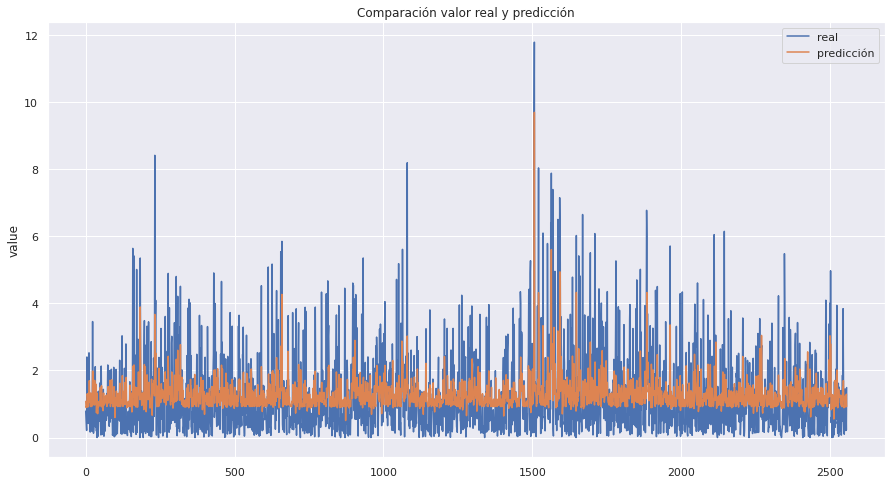

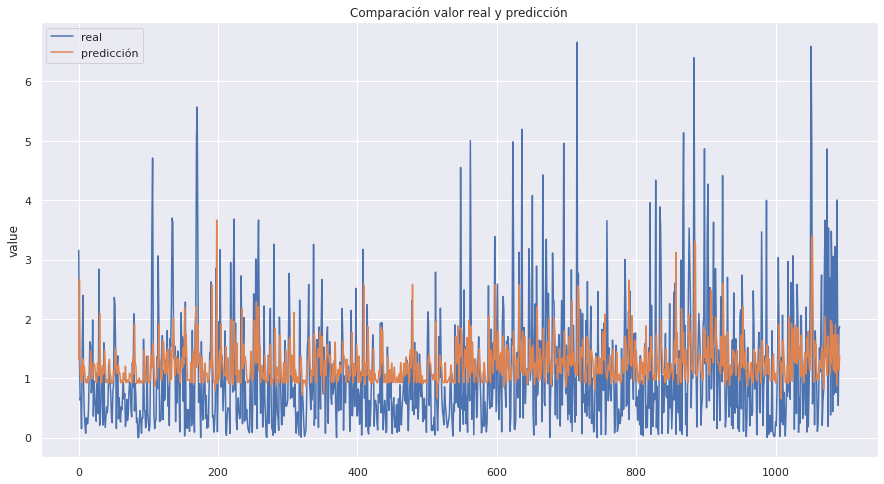

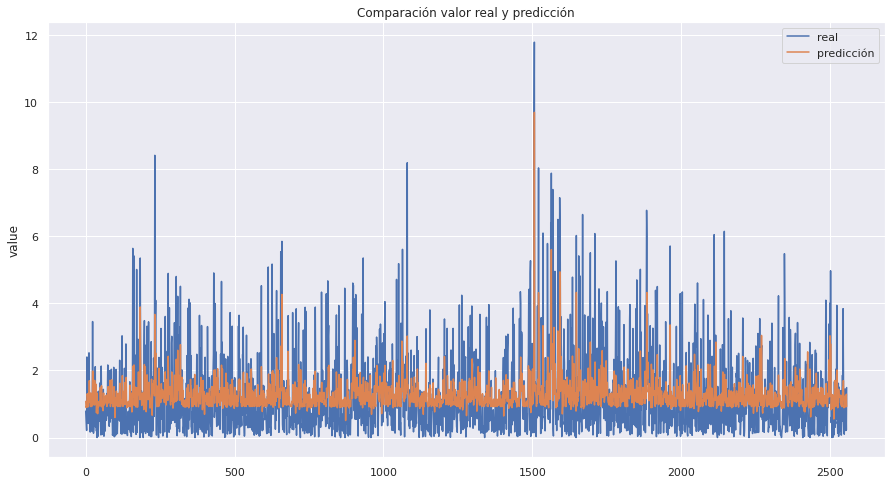

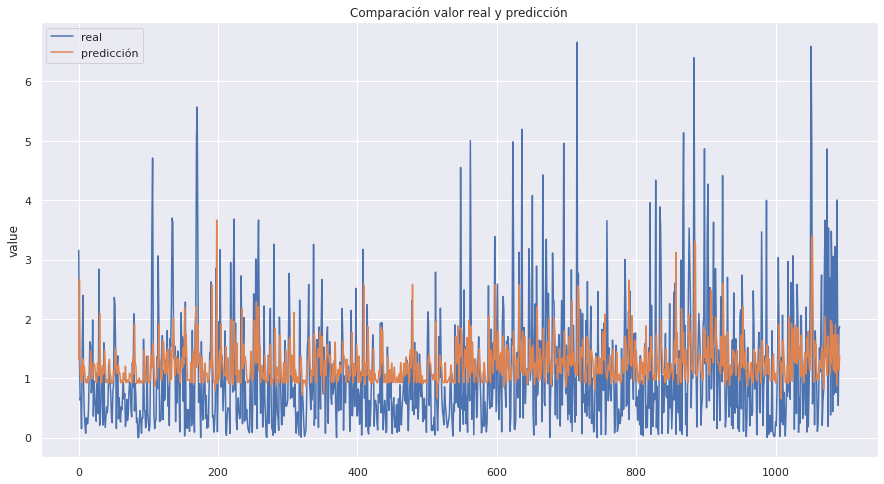

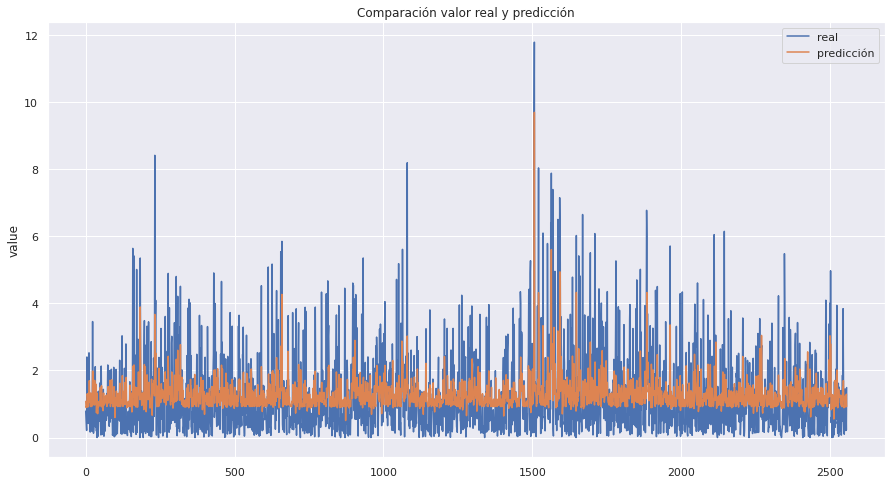

...

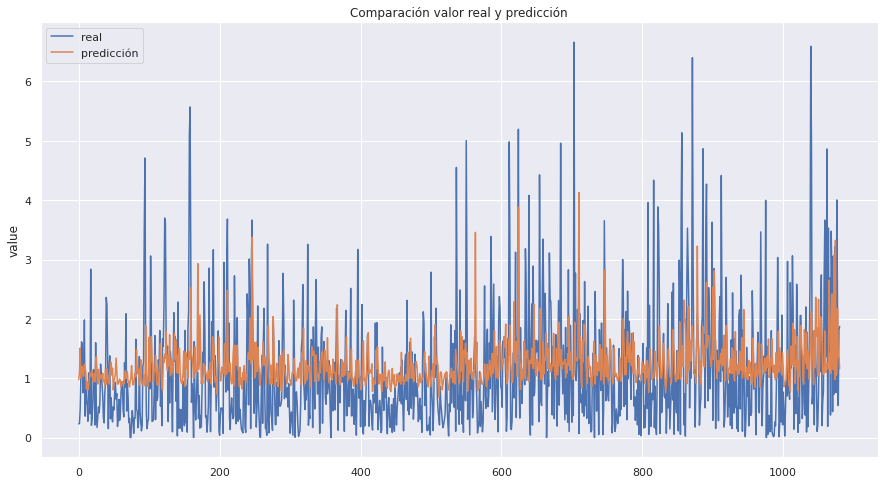

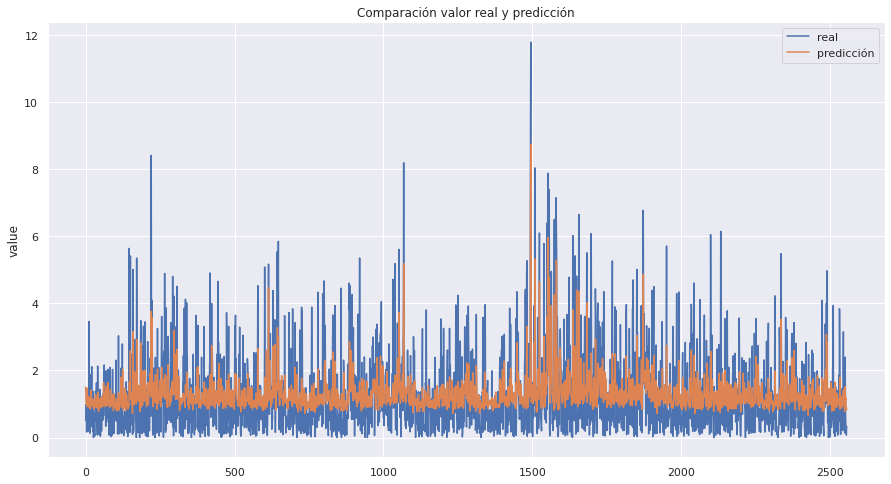

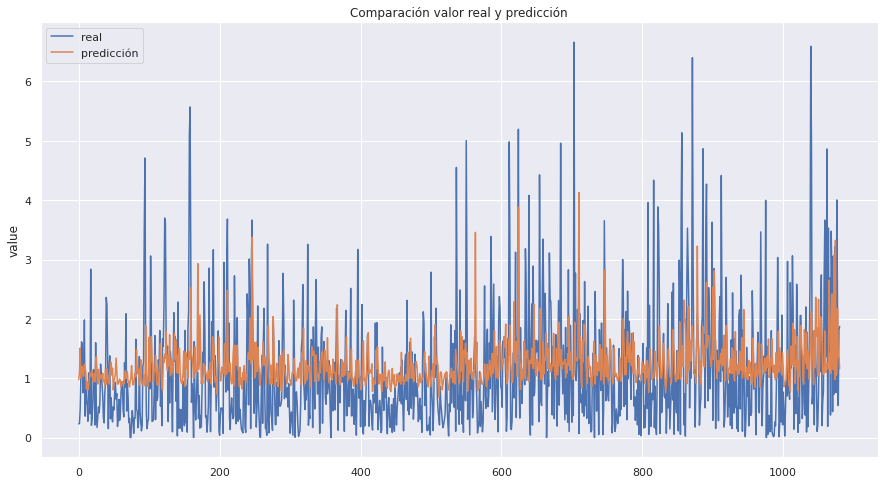

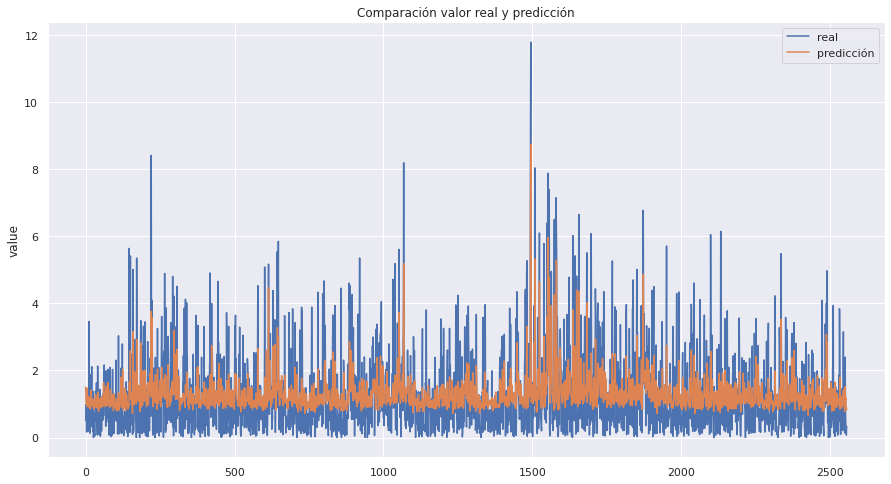

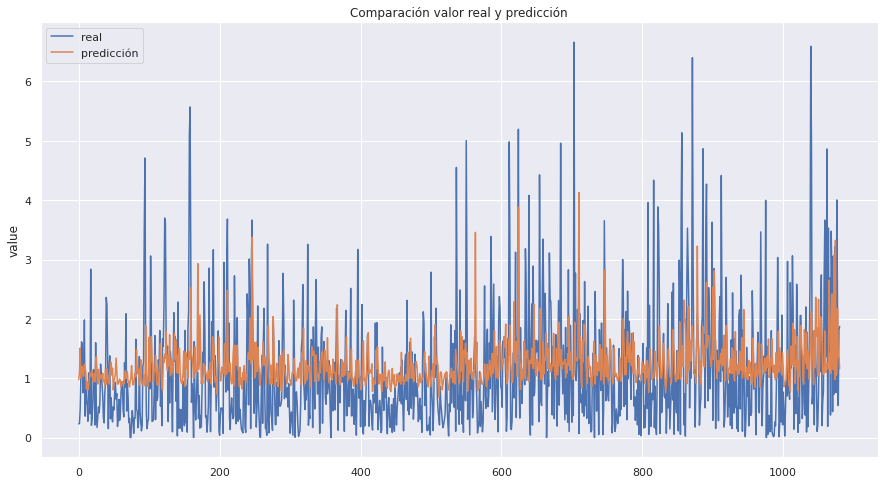

In [36]:
lags=[3,5,7,8,10,15]
n_estimators=[i for i in range(10,100,10)]
n_estimators.extend([200,300,500])
results_models={i:{} for i in lags}
for lg in lags:
    for est in n_estimators:
        results_models[lg][est]=Model(df_data.copy(),df_label.copy(),lg,est)